### Experiments with crepe

In [8]:
import crepe
import librosa
from scipy.io import wavfile

name = "demucs_separated/mdx_extra/ПОШЛАЯ МОЛЛИ - Контракт/vocals.mp3"
audio, sr = librosa.load(name)
# sr, audio = wavfile.read(name)
time, frequency, confidence, activation = crepe.predict(audio, sr, viterbi=True)

/Users/dsprotasov/MusicNIR/venv/lib/python3.8/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


641/641 [==============================] - 179s 279ms/step


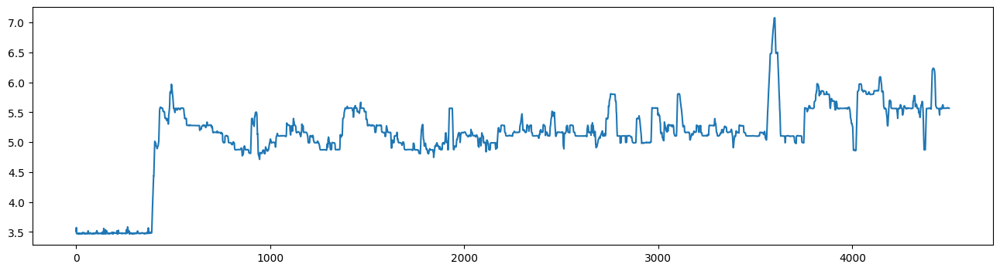

In [9]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=[16, 4])
plt.plot(np.log(frequency)[500:5000])
plt.show()

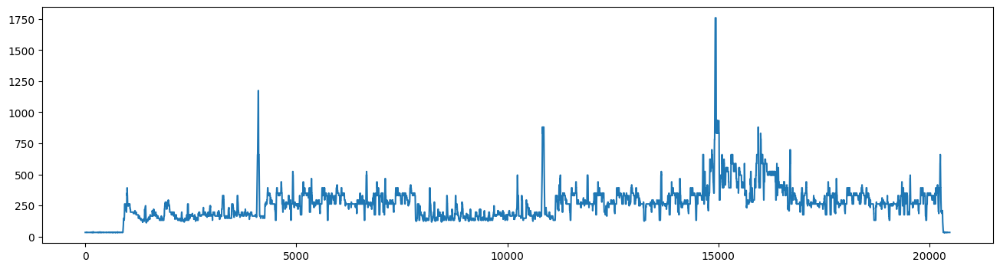

In [11]:
from IPython.display import display, Audio

notes = librosa.hz_to_note(frequency)
note_audio = librosa.note_to_hz(notes)
plt.figure(figsize=[16, 4])
plt.plot(note_audio)
display(Audio(note_audio, rate=sr))

### Demucs

In [1]:
!pwd

/Users/dsprotasov/MusicNIR/MusicNIR/code


In [11]:
for subdir in os.listdir('../figures'):
    for png_file in os.listdir(os.path.join('../figures', subdir)):
        print(os.path.join(subdir, png_file))

Heartbeat - Childish Gambino/vocals.png
Heartbeat - Childish Gambino/drums.png
Heartbeat - Childish Gambino/other.png
Heartbeat - Childish Gambino/bass.png
Пошлая Молли, Элджей - Дом Периньон/vocals.png
Пошлая Молли, Элджей - Дом Периньон/drums.png
Пошлая Молли, Элджей - Дом Периньон/other.png
Пошлая Молли, Элджей - Дом Периньон/bass.png
Marshmello-feat-Omar-Linx_-_Keep-It-Mello/vocals.png
Marshmello-feat-Omar-Linx_-_Keep-It-Mello/drums.png
Marshmello-feat-Omar-Linx_-_Keep-It-Mello/other.png
Marshmello-feat-Omar-Linx_-_Keep-It-Mello/bass.png
Ed Sheeran - Shape Of You/vocals.png
Ed Sheeran - Shape Of You/drums.png
Ed Sheeran - Shape Of You/other.png
Ed Sheeran - Shape Of You/bass.png
Justin Bieber - What Do You Mean/vocals.png
Justin Bieber - What Do You Mean/drums.png
Justin Bieber - What Do You Mean/other.png
Justin Bieber - What Do You Mean/bass.png
alan-walker-fade/vocals.png
alan-walker-fade/drums.png
alan-walker-fade/other.png
alan-walker-fade/bass.png
Martin Garrix — Animals/

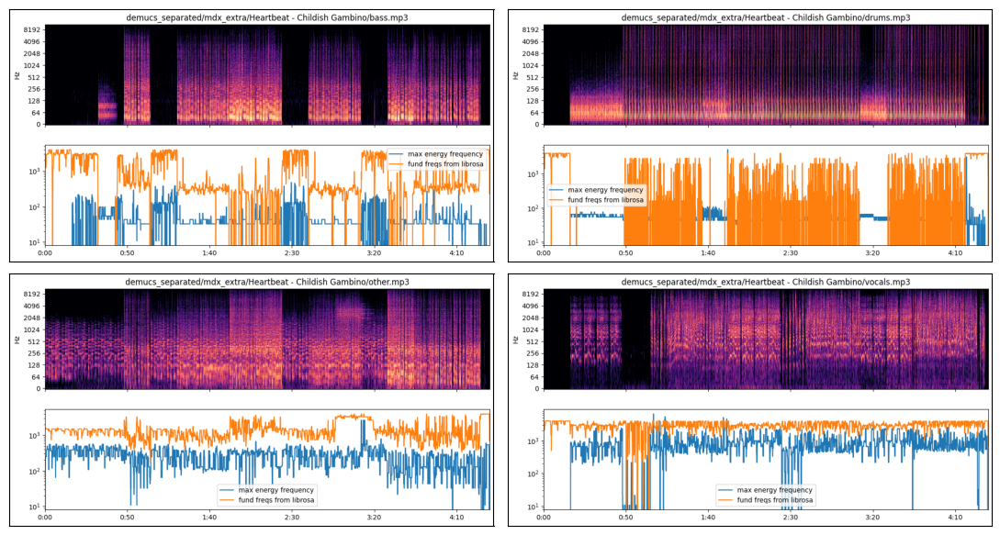

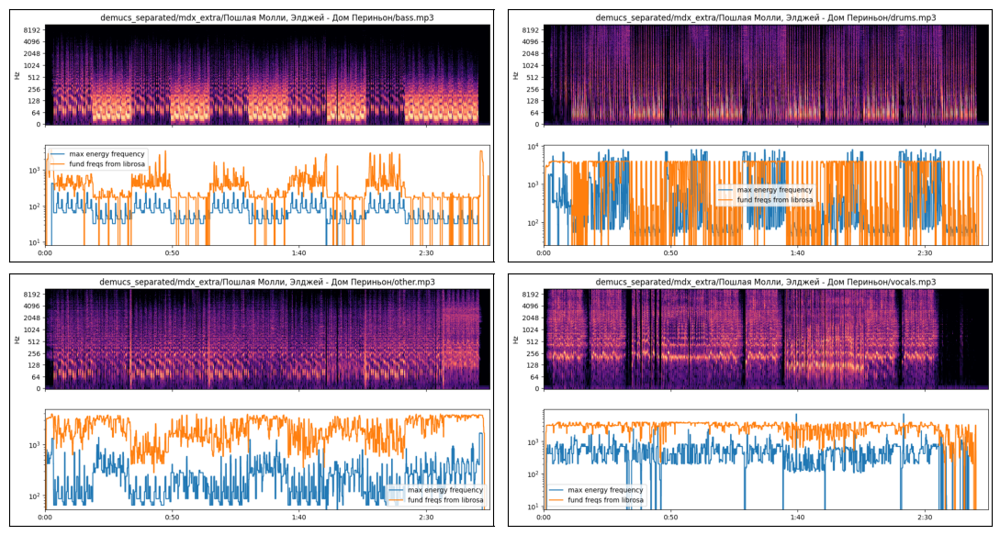

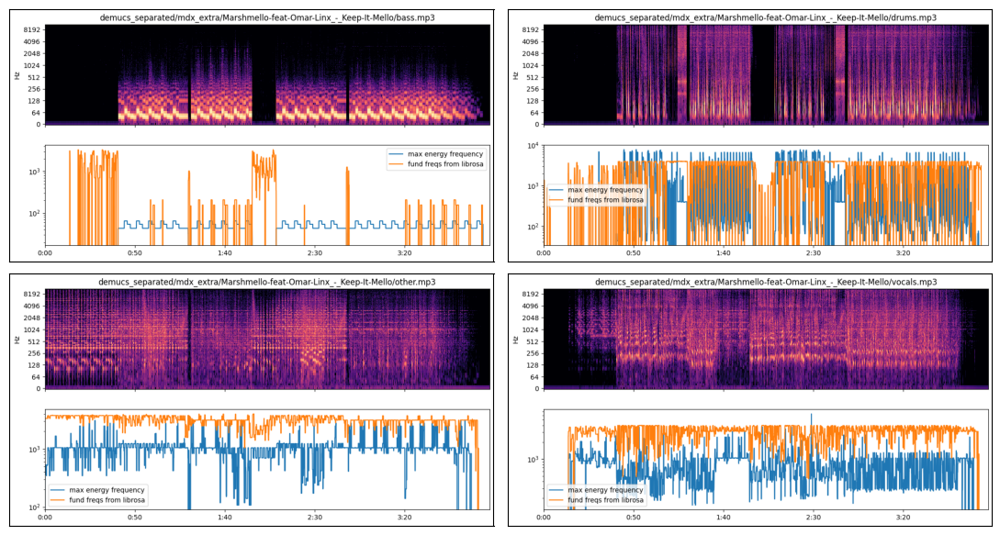

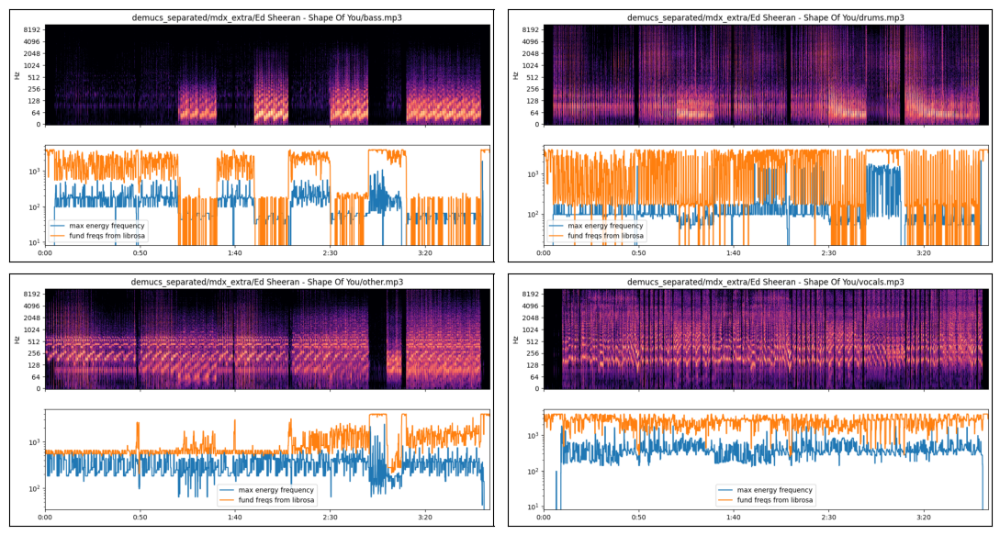

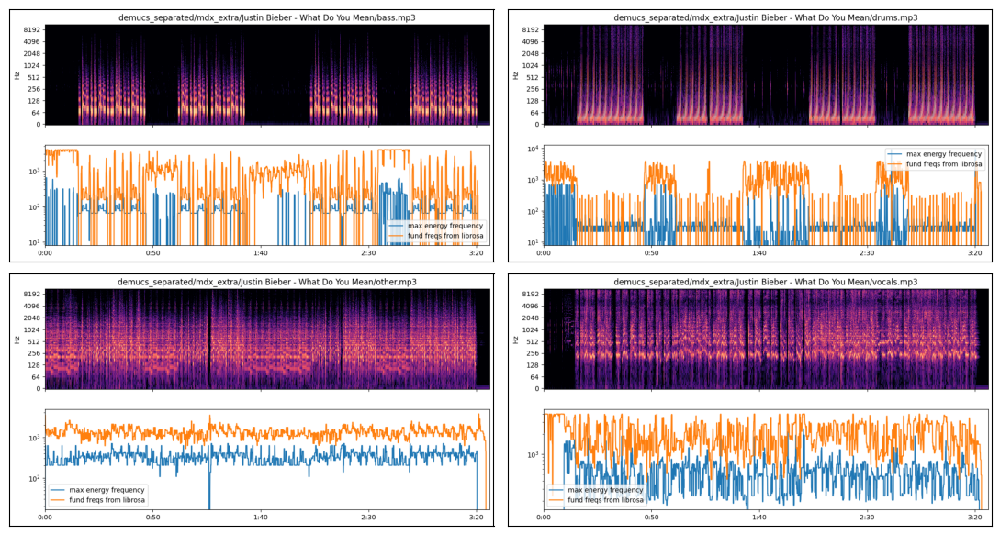

...

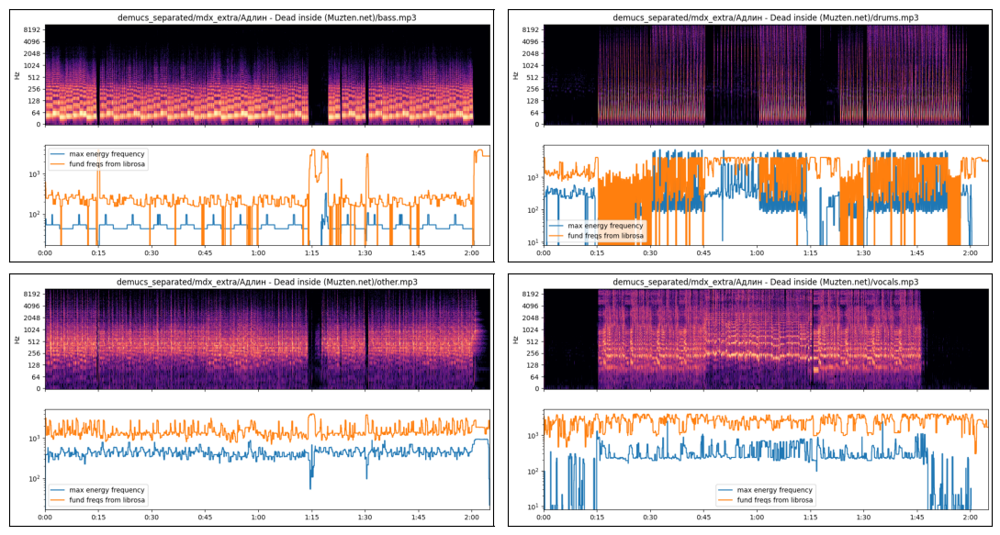

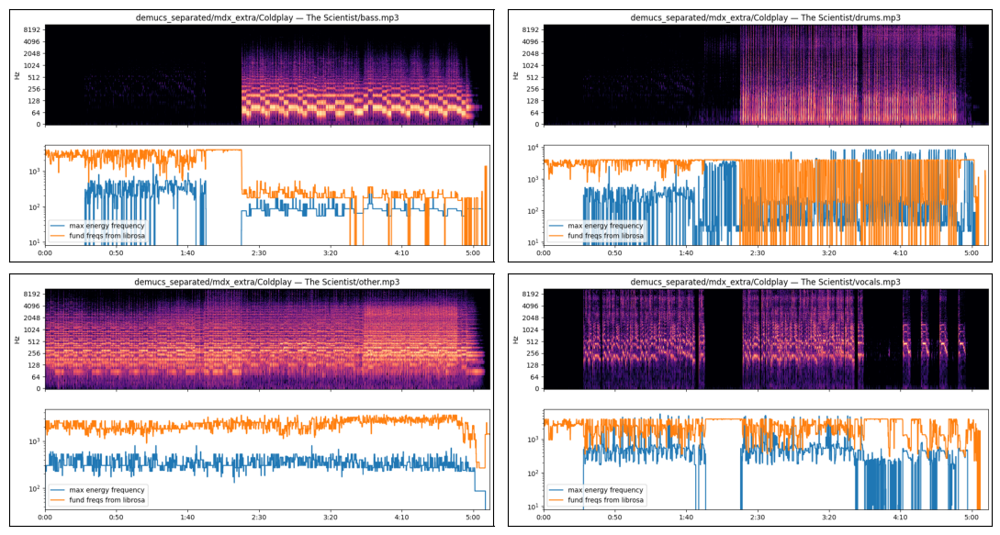

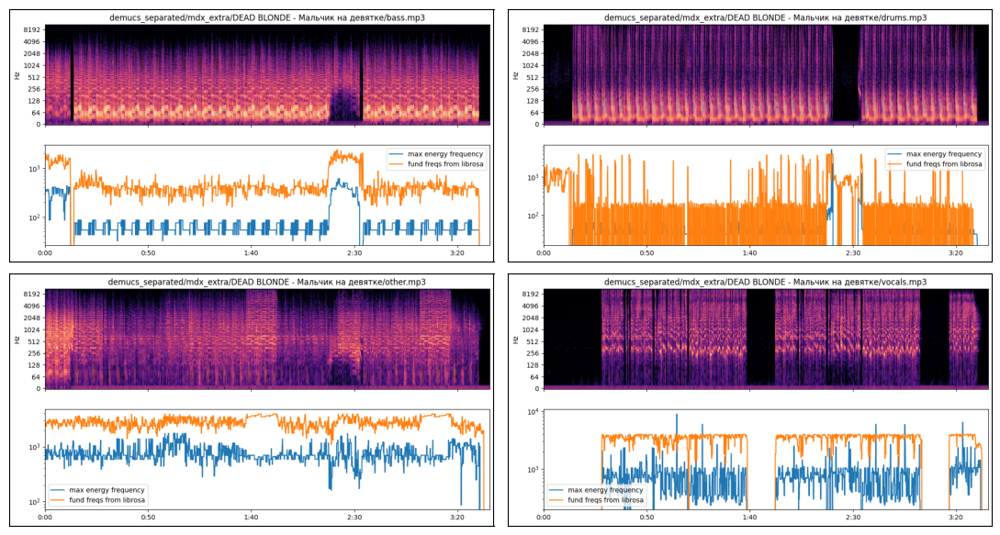

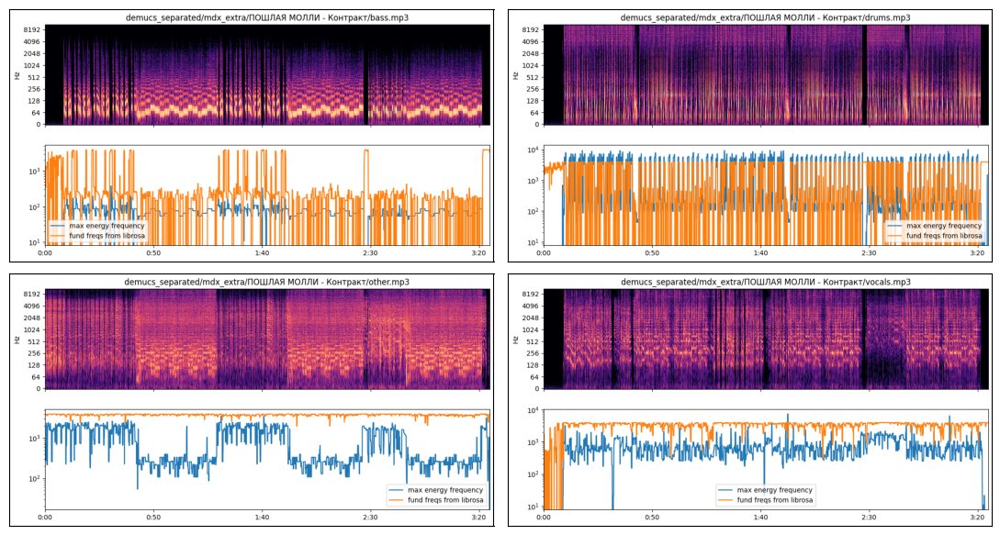

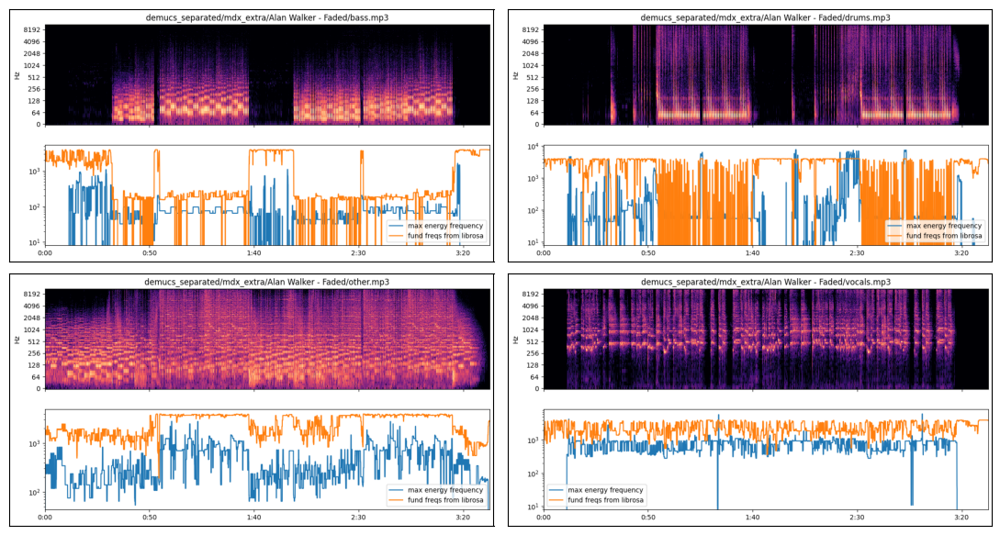

In [21]:
import matplotlib.pyplot as plt
from PIL import Image
import os

def create_and_display_grid_for_track(track_path):
    # Assuming the track directory contains four image files: vocals, drums, other, bass
    image_files = sorted(os.listdir(track_path))  # Sort to maintain a consistent order

    # Create a figure and a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(11, 6))
    axs = axs.flatten()  # Flatten for easy iteration

    for ax, img_file in zip(axs, image_files):
        img_path = os.path.join(track_path, img_file)  # Construct the full image path
        img = Image.open(img_path)  # Load the image
        ax.imshow(img)  # Display the image
        ax.set_xticks([])  # Remove axis ticks
        ax.set_yticks([])

    plt.tight_layout()
    plt.show()  # Display the plot

# Directory containing all track folders
base_directory = '../figures'
# Iterate over all track directories and create a grid for each
for track_dir in os.listdir(base_directory):
    track_path = os.path.join(base_directory, track_dir)
    if os.path.isdir(track_path):
        create_and_display_grid_for_track(track_path)
